In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from lightgbm import LGBMRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import root_mean_squared_error
from sklearn.metrics import mean_absolute_error


df1=pd.read_csv("EGLL_2023-08-21_00-00_till_2023-08-31_23-30.csv")
df2=pd.read_csv("EGLL_2023-08-01_00-00_till_2023-08-15_23-30.csv")
df3=pd.read_csv("EGLL_2023-07-16_00-00_till_2023-07-30_23-30.csv")
df4=pd.read_csv("EGLL_2023-07-01_00-00_till_2023-07-15_23-30.csv")
df5=pd.read_csv("EGLL_2023-06-16_00-00_till_2023-06-30_23-30.csv")
df6=pd.read_csv("EGLL_2023-06-1_00-00_till_2023-06-15_23-30.csv")
df7=pd.read_csv("EGLL_2023-05-16_00-00_till_2023-05-31_23-30.csv")
df8=pd.read_csv("EGLL_2023-05-1_00-00_till_2023-05-15_23-30.csv")
df9=pd.read_csv("EGLL_2023-04-15_00-00_till_2023-04-30_23-30.csv")
df10=pd.read_csv("EGLL_2023-04-01_00-00_till_2023-04-14_23-30.csv")

In [2]:
frames = [df1, df2,df3,df4,df5,df6,df7,df8,df9,df10]

df = pd.concat(frames,ignore_index=True)
df=df.sort_values(by='TimeStamp')
df

,Unnamed: 0,Flight Number,Holding Time (minutes),Type Code,Time over fix,Big,Ock,Bov,Lam,WTC L,...,Altitude at -60,Departures delayIndex at -0,Arrivals numCancelled at -0,Arrivals delayIndex at -0,Departures delayIndex at -30,Arrivals numCancelled at -30,Arrivals delayIndex at -30,Departures delayIndex at -60,Arrivals numCancelled at -60,Arrivals delayIndex at -60
70378,0,VIR450 _4170,0.0,B789,2023-04-01 03:31:29,1,0,0,0,0.0,...,40000.0,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.0,0.0
70379,1,BAW074 _2949,0.0,B77W,2023-04-01 03:58:29,0,1,0,0,0.0,...,36000.0,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.0,0.0
70380,2,BAW124 _1015,0.0,B772,2023-04-01 04:08:59,0,0,0,1,0.0,...,39000.0,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.0,0.0
70381,3,CPA251 _7192,0.0,B77W,2023-04-01 04:11:29,0,0,0,1,0.0,...,35000.0,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.0,0.0
70382,4,BAW58L _1080,0.0,B772,2023-04-01 04:22:29,1,0,0,0,0.0,...,38000.0,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5224,5224,SWR10GD _3608,0.0,BCS1,NaN,0,0,0,0,0.0,...,0.0,2.06,14.0,0.56,2.28,11.0,0.56,2.19,8.0,0.0
5225,5225,MSR777 _007,0.0,B77W,NaN,0,0,0,0,0.0,...,37000.0,2.06,14.0,0.56,2.28,11.0,0.56,2.19,8.0,0.0
5226,5226,BAW9253 _732,0.0,A319,2023-08-29 11:56:29,0,0,1,0,0.0,...,0.0,2.06,14.0,0.56,2.28,11.0,0.56,2.19,8.0,0.0
5227,5227,BAW343E _2632,0.0,A20N,NaN,0,0,0,0,0.0,...,28000.0,2.06,14.0,0.56,2.28,11.0,0.56,2.19,8.0,0.0


In [3]:
df.columns

Index(['Unnamed: 0', 'Flight Number', 'Holding Time (minutes)', 'Type Code',
       'Time over fix', 'Big', 'Ock', 'Bov', 'Lam', 'WTC L', 'WTC M', 'WTC H',
       'WTC J', 'Engine Jet', 'Engine Turboprop/shaft', 'TimeStamp',
       'Ceiling at -0', 'Wind at -0', 'Precip at -0', 'Freezing at -0',
       'Phenomena at -0', 'Wind Direction at -0', 'Wind Speed at -0',
       'Ceiling at -30', 'Wind at -30', 'Precip at -30', 'Freezing at -30',
       'Phenomena at -30', 'Wind Direction at -30', 'Wind Speed at -30',
       'Ceiling at -60', 'Wind at -60', 'Precip at -60', 'Freezing at -60',
       'Phenomena at -60', 'Wind Direction at -60', 'Wind Speed at -60', 'day',
       'month', 'year', 'hour', 'minute', 'day_of_week', 'Day_0', 'Day_1',
       'Day_2', 'Day_3', 'Day_4', 'Day_5', 'Day_6', 'Decimal Hours -0',
       'Decimal Hours -30', 'Decimal Hours -60', 'Time leaving fix',
       'Holding flights at -0', 'Holding flights at -30',
       'Holding flights at -60', 'Last Timestamp', 'La

In [4]:
df_model1 = df[['Holding Time (minutes)', 'Big', 'Ock', 'Bov', 'Lam', 'WTC L', 'WTC M', 'WTC H','WTC J', 'Engine Jet', 'Engine Turboprop/shaft','Ceiling at -0', 'Wind at -0', 'Precip at -0', 'Freezing at -0','Phenomena at -0', 'day','month', 'Day_0', 'Day_1','Day_2', 'Day_3', 'Day_4', 'Day_5', 'Day_6', 'Decimal Hours -0','Holding flights at -0', 'Runway 09L', 'Runway 09R', 'Runway 27L', 'Runway 27R','Crosswind Component at -0', 'Headwind Component at -0','No of Landings 1HR at -0', 'Ground Speed at -0', 'Track at -0','Altitude at -0', 'Departures delayIndex at -0','Arrivals numCancelled at -0', 'Arrivals delayIndex at -0']]
df_model2 = df[['Holding Time (minutes)', 'Big', 'Ock', 'Bov', 'Lam', 'WTC L', 'WTC M', 'WTC H','WTC J', 'Engine Jet', 'Engine Turboprop/shaft','Ceiling at -30', 'Wind at -30', 'Precip at -30', 'Freezing at -30','Phenomena at -30', 'day','month', 'Day_0', 'Day_1','Day_2', 'Day_3', 'Day_4', 'Day_5', 'Day_6', 'Decimal Hours -30','Holding flights at -30', 'Runway 09L', 'Runway 09R', 'Runway 27L', 'Runway 27R','Crosswind Component at -30', 'Headwind Component at -30','No of Landings 1HR at -30', 'Ground Speed at -30', 'Track at -30','Altitude at -30', 'Departures delayIndex at -30','Arrivals numCancelled at -30', 'Arrivals delayIndex at -30']]
df_model3 = df[['Holding Time (minutes)', 'Big', 'Ock', 'Bov', 'Lam', 'WTC L', 'WTC M', 'WTC H','WTC J', 'Engine Jet', 'Engine Turboprop/shaft','Ceiling at -60', 'Wind at -60', 'Precip at -60', 'Freezing at -60','Phenomena at -60', 'day','month', 'Day_0', 'Day_1','Day_2', 'Day_3', 'Day_4', 'Day_5', 'Day_6', 'Decimal Hours -60','Holding flights at -60', 'Runway 09L', 'Runway 09R', 'Runway 27L', 'Runway 27R','Crosswind Component at -60', 'Headwind Component at -60','No of Landings 1HR at -60', 'Ground Speed at -60', 'Track at -60','Altitude at -60', 'Departures delayIndex at -60','Arrivals numCancelled at -60', 'Arrivals delayIndex at -60']]
df_model_all=df[['Holding Time (minutes)','Big', 'Ock', 'Bov', 'Lam', 'WTC L', 'WTC M', 'WTC H','WTC J', 'Engine Jet', 'Engine Turboprop/shaft',
                'Ceiling at -0', 'Wind at -0', 'Precip at -0', 'Freezing at -0','Phenomena at -0','Ceiling at -30', 'Wind at -30', 'Precip at -30', 'Freezing at -30','Phenomena at -30','Ceiling at -60', 'Wind at -60', 'Precip at -60', 'Freezing at -60','Phenomena at -60', 'day','month', 'Day_0', 'Day_1','Day_2', 'Day_3', 'Day_4', 'Day_5', 'Day_6', 'Decimal Hours -0','Holding flights at -0', 'Holding flights at -30','Holding flights at -60', 'Runway 09L', 'Runway 09R', 'Runway 27L', 'Runway 27R','Crosswind Component at -0', 'Headwind Component at -0','Crosswind Component at -30', 'Headwind Component at -30','Crosswind Component at -60', 'Headwind Component at -60','No of Landings 1HR at -0', 'No of Landings 1HR at -30','No of Landings 1HR at -60', 'Ground Speed at -0', 'Track at -0',
                'Altitude at -0', 'Ground Speed at -30', 'Track at -30','Altitude at -30', 'Ground Speed at -60', 'Track at -60','Altitude at -60', 'Departures delayIndex at -0','Arrivals numCancelled at -0', 'Arrivals delayIndex at -0','Departures delayIndex at -30', 'Arrivals numCancelled at -30','Arrivals delayIndex at -30', 'Departures delayIndex at -60','Arrivals numCancelled at -60', 'Arrivals delayIndex at -60']]

In [5]:
# Check for missing values
df_model1.isnull().sum()

Holding Time (minutes)          0
Big                             0
Ock                             0
Bov                             0
Lam                             0
WTC L                           0
WTC M                           0
WTC H                           0
WTC J                           0
Engine Jet                      0
Engine Turboprop/shaft          0
Ceiling at -0                   0
Wind at -0                      0
Precip at -0                    0
Freezing at -0                  0
Phenomena at -0                 0
day                             0
month                           0
Day_0                           0
Day_1                           0
Day_2                           0
Day_3                           0
Day_4                           0
Day_5                           0
Day_6                           0
Decimal Hours -0                0
Holding flights at -0           0
Runway 09L                     11
Runway 09R                     11
Runway 27L    

In [6]:
# Load your dataset
data = df_model1

# Preprocess the data
# Fill missing values using forward fill or another appropriate method
data.fillna(method='ffill', inplace=True)

# Define features and target variable
X = data.drop(columns=['Holding Time (minutes)'])
y = data['Holding Time (minutes)']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


# Initialize LightGBM model
model = LGBMRegressor()

# Hyperparameter tuning using GridSearchCV
params = {
    'objective': ['regression'],
    'num_leaves': [15, 31, 50],
    'learning_rate': [0.01, 0.05, 0.1],
    'n_estimators': [100, 200, 500],
    'feature_fraction':[0.8,0.9,1.0],
    'bagging_fraction': [0.6,0.8,1],
    'bagging_freq': [1,5,10]
}
grid = GridSearchCV(model, params, cv=3, scoring='neg_mean_squared_error', verbose=1)
grid.fit(X_train, y_train)

# Best model
bst1 = grid.best_estimator_


# Training the model
bst1.fit(X_train, y_train)

# Predicting
predictions = bst1.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, predictions)
print(f'Mean Squared Error: {mse}')
mae=mean_absolute_error(y_test, predictions)
print(f'Mean Absolute Error: {mae}')
rmse=root_mean_squared_error(y_test, predictions)
print(f'Root Mean Square Error: {rmse}')

# Output the best parameters chosen by GridSearchCV
print(f'Best Parameters: {grid.best_params_}')

# Making predictions for every second for each flight
# Assuming we have a new dataset `new_data` for which we want to make predictions
#new_data = pd.read_csv('new_data.csv')
#new_data.fillna(method='ffill', inplace=True)

# Ensure the new data has the same features as the training data
#X_new = new_data[features]
#new_predictions = best_model.predict(X_new)

# Save predictions if needed
#new_data['predicted_holding_time'] = new_predictions
#new_data.to_csv('predicted_holding_times.csv', index=False)


C:\Users\mic__\AppData\Local\Temp\ipykernel_28576\565626062.py:6: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
C:\Users\mic__\AppData\Local\Temp\ipykernel_28576\565626062.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.fillna(method='ffill', inplace=True)


Fitting 3 folds for each of 729 candidates, totalling 2187 fits
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001183 seconds.
You can set `force_row_wise=true` to remove the overhe

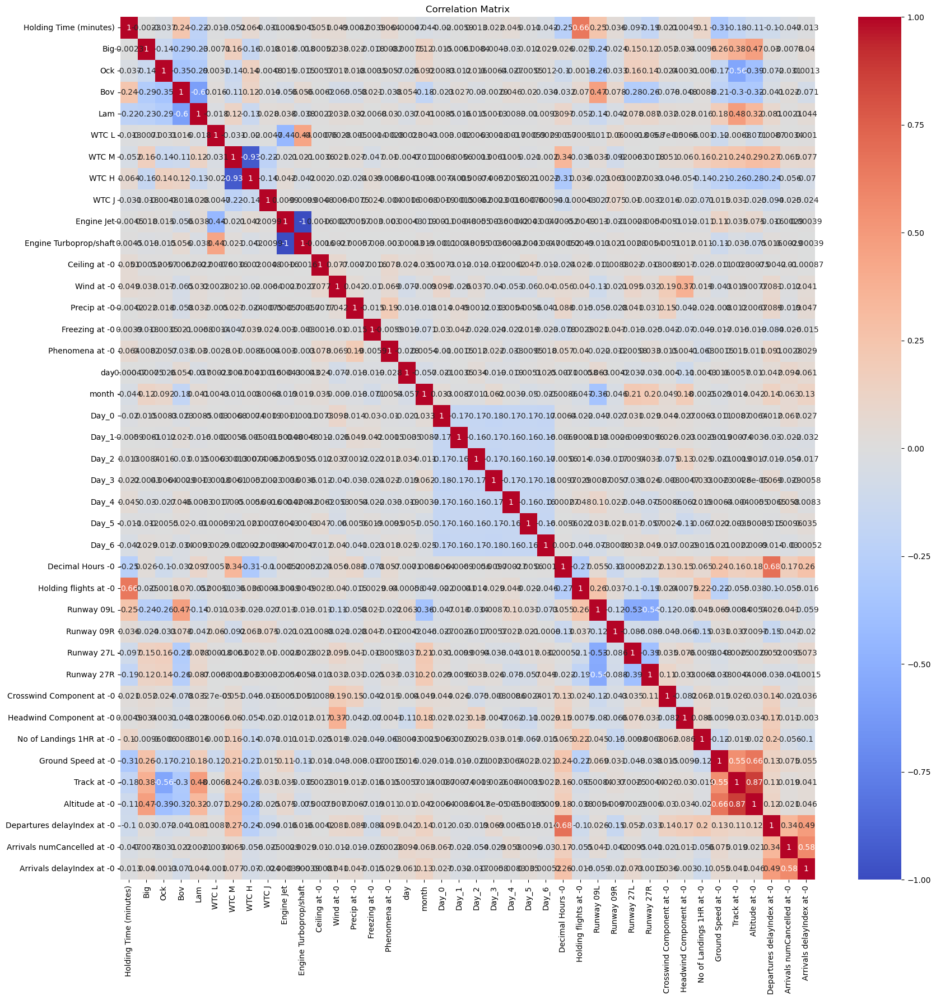

In [7]:
# Correlation analysis
plt.figure(figsize=(20, 20))
sns.heatmap(df_model1.corr(numeric_only=True), annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

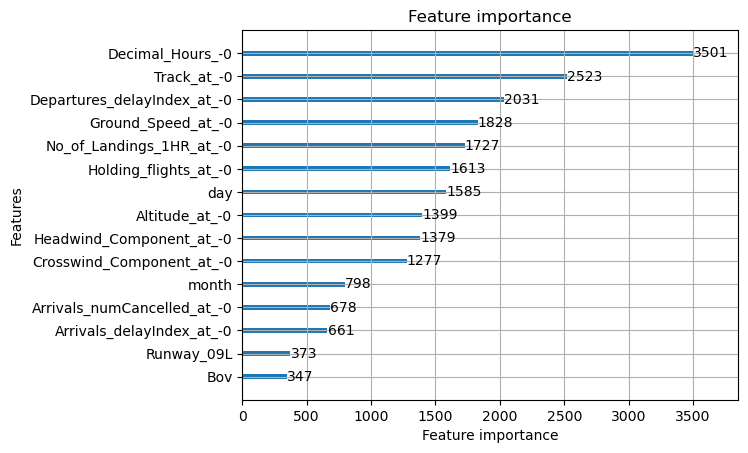

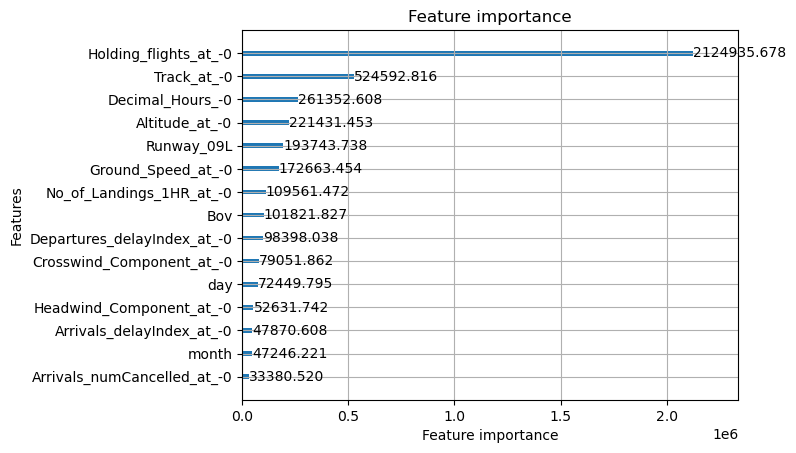

In [8]:
import matplotlib.pyplot as plt
import lightgbm as lgb
lgb.plot_importance(bst1, importance_type='split', max_num_features=15)
plt.show()

# Alternatively, for gain instead of split:
lgb.plot_importance(bst1, importance_type='gain', max_num_features=15)
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


       Actual Holding Time (minutes)  Predicted Holding Time (minutes)  \
0                               11.0                          6.565378   
1                                0.0                          1.859966   
2                                5.0                          3.754951   
3                                4.0                          5.086893   
4                                6.5                          5.132386   
...                              ...                               ...   
15786                            0.0                          0.489178   
15787                            0.0                          0.031011   
15788                            0.0                          0.507518   
15789                            0.0                          0.377293   
15790                            0.0                          0.353536   

       Difference (minutes)  
0                 -4.434622  
1                  1.859966  
2                 -1.

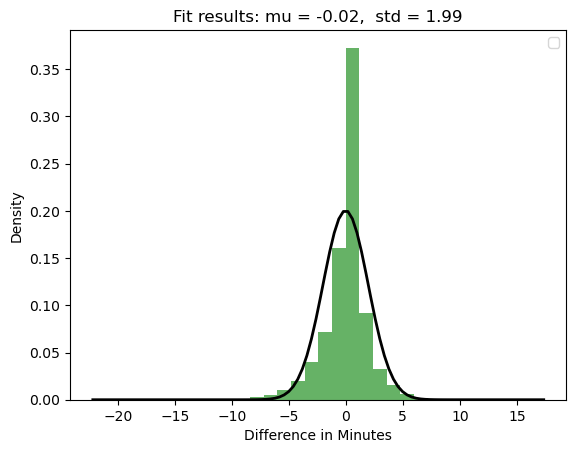

In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

# Creating a DataFrame of display actual vs predicted values
results_df = pd.DataFrame({'Actual Holding Time (minutes)': y_test, 'Predicted Holding Time (minutes)': predictions,'Difference (minutes)':(predictions-y_test)})

#Resetting the index of the DataFrame 
results_df = results_df.reset_index(drop=True)

print(results_df)
#results_df.to_csv('difference bell curve')

# Calculate mean and standard deviation of the differences
mu, std = results_df['Difference (minutes)'].mean(), results_df['Difference (minutes)'].std()

# Plot histogram of the differences
plt.hist(results_df['Difference (minutes)'], bins=30, density=True, alpha=0.6, color='g')

# Add a normal distribution curve
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, std)
plt.plot(x, p, 'k', linewidth=2)
title = "Fit results: mu = %.2f,  std = %.2f" % (mu, std)
plt.title(title)

# Adding legend
plt.legend()

# Add title and labels
#plt.title("Distribution of Time Difference between Actual and Predicted in Minutes")
plt.xlabel("Difference in Minutes")
plt.ylabel("Density")

#save the plot in png
plt.savefig("Density_histogram.png")

# Show the plot
plt.show()

In [10]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from lightgbm import LGBMRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import root_mean_squared_error

# Load your dataset
data = df_model2

# Preprocess the data
# Fill missing values using forward fill or another appropriate method
data.fillna(method='ffill', inplace=True)

# Define features and target variable
X = data.drop(columns=['Holding Time (minutes)'])
y = data['Holding Time (minutes)']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


# Initialize LightGBM model
model = LGBMRegressor()

# Hyperparameter tuning using GridSearchCV
params = {
    'objective': ['regression'],
    'num_leaves': [15, 31, 50],
    'learning_rate': [0.01, 0.05, 0.1],
    'n_estimators': [100, 200, 500],
    'feature_fraction':[0.8,0.9,1.0],
    'bagging_fraction': [0.6,0.8,1],
    'bagging_freq': [1,5,10]
}
grid = GridSearchCV(model, params, cv=3, scoring='neg_mean_squared_error', verbose=1)
grid.fit(X_train, y_train)

# Best model
bst2 = grid.best_estimator_


# Training the model
bst2.fit(X_train, y_train)

# Predicting
predictions = bst2.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, predictions)
print(f'Mean Squared Error: {mse}')
mae=mean_absolute_error(y_test, predictions)
print(f'Mean Absolute Error: {mae}')
rmse=root_mean_squared_error(y_test, predictions)
print(f'Root Mean Square Error: {rmse}')

# Output the best parameters chosen by GridSearchCV
print(f'Best Parameters: {grid.best_params_}')

# Making predictions for every second for each flight
# Assuming we have a new dataset `new_data` for which we want to make predictions
#new_data = pd.read_csv('new_data.csv')
#new_data.fillna(method='ffill', inplace=True)

# Ensure the new data has the same features as the training data
#X_new = new_data[features]
#new_predictions = best_model.predict(X_new)

# Save predictions if needed
#new_data['predicted_holding_time'] = new_predictions
#new_data.to_csv('predicted_holding_times.csv', index=False)


C:\Users\mic__\AppData\Local\Temp\ipykernel_28576\2885464320.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
C:\Users\mic__\AppData\Local\Temp\ipykernel_28576\2885464320.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.fillna(method='ffill', inplace=True)


Fitting 3 folds for each of 729 candidates, totalling 2187 fits
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000965 seconds.
You can set `force_row_wise=true` to remove the overhe

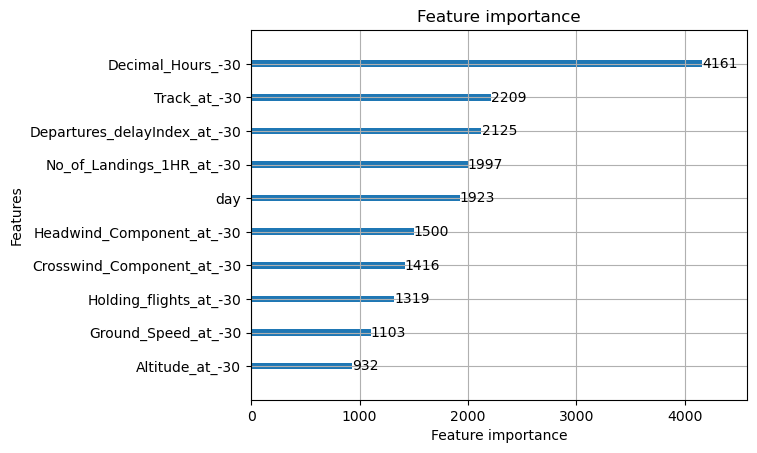

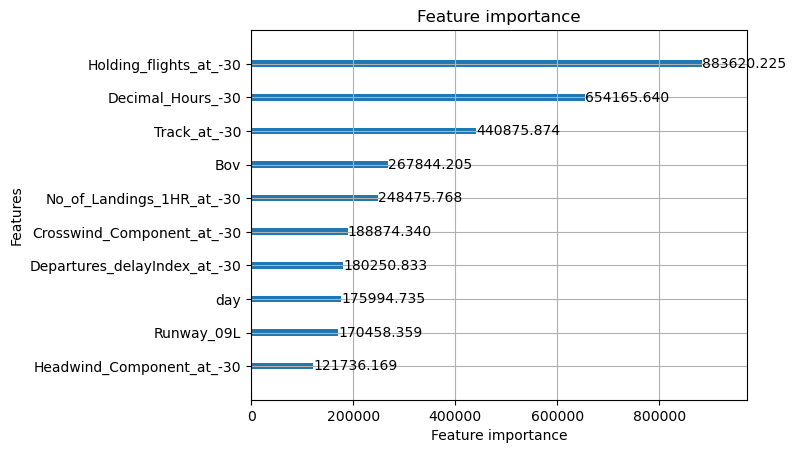

In [11]:
import matplotlib.pyplot as plt

lgb.plot_importance(bst2, importance_type='split', max_num_features=10)
plt.show()

# Alternatively, for gain instead of split:
lgb.plot_importance(bst2, importance_type='gain', max_num_features=10)
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


       Actual Holding Time (minutes)  Predicted Holding Time (minutes)  \
0                               11.0                          3.843971   
1                                0.0                          1.770471   
2                                5.0                          1.972469   
3                                4.0                          5.265504   
4                                6.5                          4.748881   
...                              ...                               ...   
15786                            0.0                          1.236894   
15787                            0.0                          0.411505   
15788                            0.0                          1.013127   
15789                            0.0                         -0.371026   
15790                            0.0                          0.694674   

       Difference (minutes)  
0                 -7.156029  
1                  1.770471  
2                 -3.

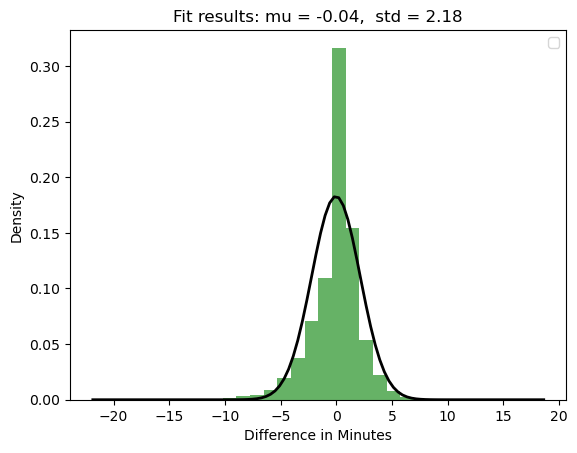

In [12]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

# Creating a DataFrame of display actual vs predicted values
results_df = pd.DataFrame({'Actual Holding Time (minutes)': y_test, 'Predicted Holding Time (minutes)': predictions,'Difference (minutes)':(predictions-y_test)})

#Resetting the index of the DataFrame 
results_df = results_df.reset_index(drop=True)

print(results_df)
#results_df.to_csv('difference bell curve')

# Calculate mean and standard deviation of the differences
mu, std = results_df['Difference (minutes)'].mean(), results_df['Difference (minutes)'].std()

# Plot histogram of the differences
plt.hist(results_df['Difference (minutes)'], bins=30, density=True, alpha=0.6, color='g')

# Add a normal distribution curve
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, std)
plt.plot(x, p, 'k', linewidth=2)
title = "Fit results: mu = %.2f,  std = %.2f" % (mu, std)
plt.title(title)

# Adding legend
plt.legend()

# Add title and labels
#plt.title("Distribution of Time Difference between Actual and Predicted in Minutes")
plt.xlabel("Difference in Minutes")
plt.ylabel("Density")

#save the plot in png
plt.savefig("Density_histogram.png")

# Show the plot
plt.show()

In [13]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from lightgbm import LGBMRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import root_mean_squared_error

# Load your dataset
data = df_model3

# Preprocess the data
# Fill missing values using forward fill or another appropriate method
data.fillna(method='ffill', inplace=True)

# Define features and target variable
X = data.drop(columns=['Holding Time (minutes)'])
y = data['Holding Time (minutes)']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


# Initialize LightGBM model
model = LGBMRegressor()

# Hyperparameter tuning using GridSearchCV
params = {
    'objective': ['regression'],
    'num_leaves': [15, 31, 50],
    'learning_rate': [0.01, 0.05, 0.1],
    'n_estimators': [100, 200, 500],
    'feature_fraction':[0.8,0.9,1.0],
    'bagging_fraction': [0.6,0.8,1],
    'bagging_freq': [1,5,10]
}
grid = GridSearchCV(model, params, cv=3, scoring='neg_mean_squared_error', verbose=1)
grid.fit(X_train, y_train)

# Best model
bst3 = grid.best_estimator_


# Training the model
bst3.fit(X_train, y_train)

# Predicting
predictions = bst3.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, predictions)
print(f'Mean Squared Error: {mse}')
mae=mean_absolute_error(y_test, predictions)
print(f'Mean Absolute Error: {mae}')
rmse=root_mean_squared_error(y_test, predictions)
print(f'Root Mean Square Error: {rmse}')

# Output the best parameters chosen by GridSearchCV
print(f'Best Parameters: {grid.best_params_}')

# Making predictions for every second for each flight
# Assuming we have a new dataset `new_data` for which we want to make predictions
#new_data = pd.read_csv('new_data.csv')
#new_data.fillna(method='ffill', inplace=True)

# Ensure the new data has the same features as the training data
#X_new = new_data[features]
#new_predictions = best_model.predict(X_new)

# Save predictions if needed
#new_data['predicted_holding_time'] = new_predictions
#new_data.to_csv('predicted_holding_times.csv', index=False)


C:\Users\mic__\AppData\Local\Temp\ipykernel_28576\1850847470.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)
C:\Users\mic__\AppData\Local\Temp\ipykernel_28576\1850847470.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.fillna(method='ffill', inplace=True)


Fitting 3 folds for each of 729 candidates, totalling 2187 fits
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000914 seconds.
You can set `force_row_wise=true` to remove the overhe

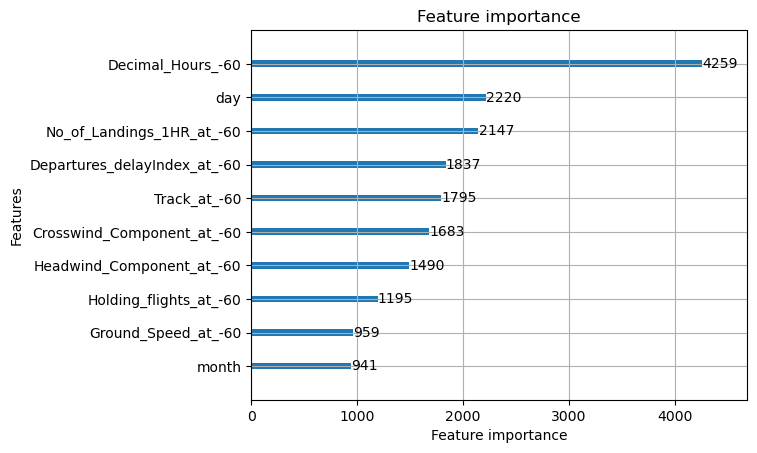

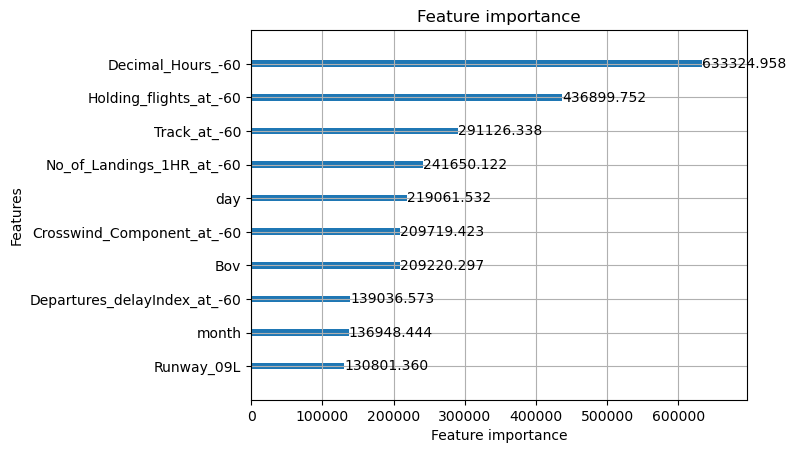

In [14]:
import matplotlib.pyplot as plt

lgb.plot_importance(bst3, importance_type='split', max_num_features=10)
plt.show()

# Alternatively, for gain instead of split:
lgb.plot_importance(bst3, importance_type='gain', max_num_features=10)
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


       Actual Holding Time (minutes)  Predicted Holding Time (minutes)  \
0                               11.0                          1.780397   
1                                0.0                          0.908289   
2                                5.0                          1.980802   
3                                4.0                          5.309033   
4                                6.5                          5.166306   
...                              ...                               ...   
15786                            0.0                          0.369042   
15787                            0.0                          0.111076   
15788                            0.0                          1.139402   
15789                            0.0                         -0.109984   
15790                            0.0                          0.210216   

       Difference (minutes)  
0                 -9.219603  
1                  0.908289  
2                 -3.

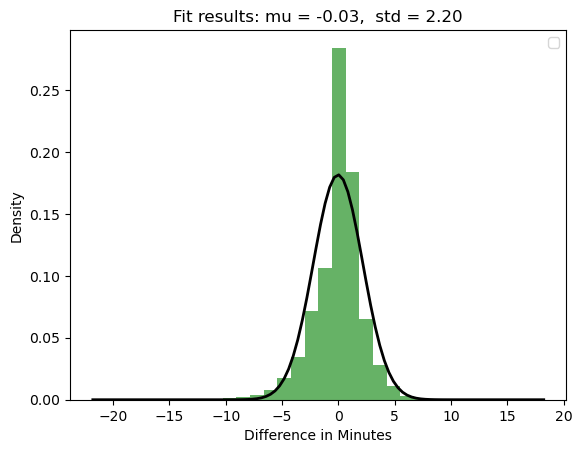

In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

# Creating a DataFrame of display actual vs predicted values
results_df = pd.DataFrame({'Actual Holding Time (minutes)': y_test, 'Predicted Holding Time (minutes)': predictions,'Difference (minutes)':(predictions-y_test)})

#Resetting the index of the DataFrame 
results_df = results_df.reset_index(drop=True)

print(results_df)
#results_df.to_csv('difference bell curve')

# Calculate mean and standard deviation of the differences
mu, std = results_df['Difference (minutes)'].mean(), results_df['Difference (minutes)'].std()

# Plot histogram of the differences
plt.hist(results_df['Difference (minutes)'], bins=30, density=True, alpha=0.6, color='g')

# Add a normal distribution curve
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, std)
plt.plot(x, p, 'k', linewidth=2)
title = "Fit results: mu = %.2f,  std = %.2f" % (mu, std)
plt.title(title)

# Adding legend
plt.legend()

# Add title and labels
#plt.title("Distribution of Time Difference between Actual and Predicted in Minutes")
plt.xlabel("Difference in Minutes")
plt.ylabel("Density")

#save the plot in png
plt.savefig("Density_histogram.png")

# Show the plot
plt.show()

In [16]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from lightgbm import LGBMRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error

# Preprocess the data
# Fill missing values. Here, numeric missing values are filled with the median, which you might adjust.
df_model_all.fillna(df_model_all.median(numeric_only=True), inplace=True)

# Load your dataset
data = df_model_all


# Define features and target variable
X = data.drop(columns=['Holding Time (minutes)'])
y = data['Holding Time (minutes)']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


# Initialize LightGBM model
model = LGBMRegressor()

# Hyperparameter tuning using GridSearchCV
params = {
    'objective': ['regression'],
    'num_leaves': [15, 31, 50],
    'learning_rate': [0.01, 0.05, 0.1],
    'n_estimators': [100, 200, 500],
    'feature_fraction':[0.8,0.9,1.0],
    'bagging_fraction': [0.6,0.8,1],
    'bagging_freq': [1,5,10]
}
grid = GridSearchCV(model, params, cv=3, scoring='neg_mean_squared_error', verbose=1)
grid.fit(X_train, y_train)

# Best model
bst4 = grid.best_estimator_


# Training the model
bst4.fit(X_train, y_train)

# Predicting
predictions = bst4.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, predictions)
print(f'Mean Squared Error: {mse}')
mae=mean_absolute_error(y_test, predictions)
print(f'Mean Absolute Error: {mae}')
rmse=root_mean_squared_error(y_test, predictions)
print(f'Root Mean Square Error: {rmse}')

# Output the best parameters chosen by GridSearchCV
print(f'Best Parameters: {grid.best_params_}')

# Making predictions for every second for each flight
# Assuming we have a new dataset `new_data` for which we want to make predictions
#new_data = pd.read_csv('new_data.csv')
#new_data.fillna(method='ffill', inplace=True)

# Ensure the new data has the same features as the training data
#X_new = new_data[features]
#new_predictions = best_model.predict(X_new)

# Save predictions if needed
#new_data['predicted_holding_time'] = new_predictions
#new_data.to_csv('predicted_holding_times.csv', index=False)



C:\Users\mic__\AppData\Local\Temp\ipykernel_28576\4115456043.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_model_all.fillna(df_model_all.median(numeric_only=True), inplace=True)


Fitting 3 folds for each of 729 candidates, totalling 2187 fits
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001820 seconds.
You can set `force_row_wise=true` to remove the overhe

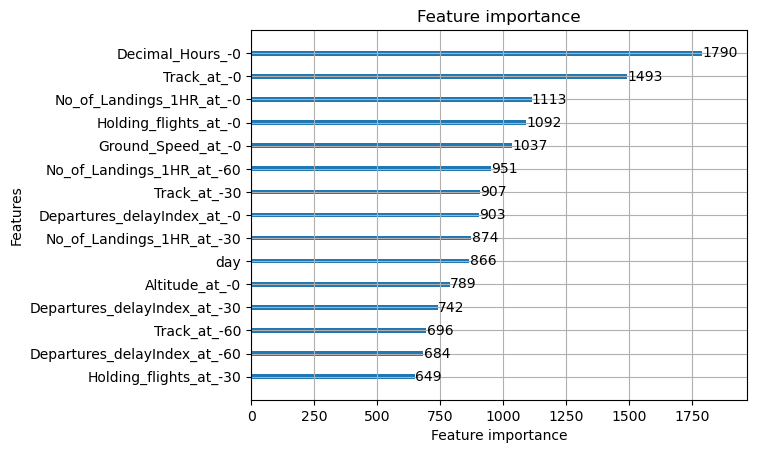

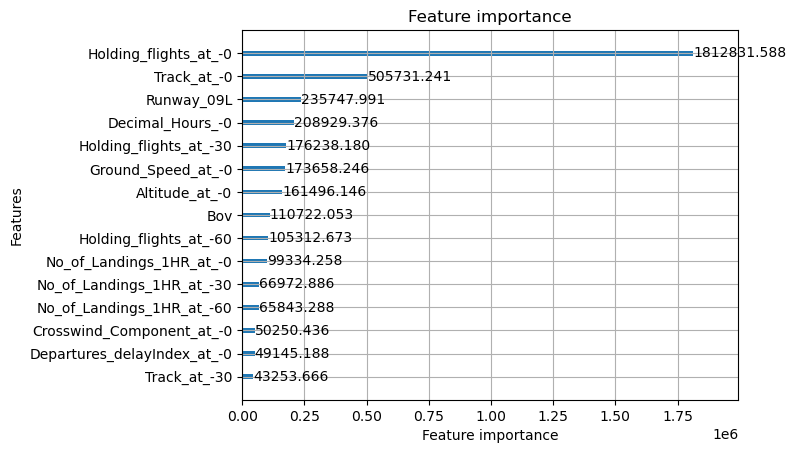

In [17]:
import matplotlib.pyplot as plt
import lightgbm as lgb

lgb.plot_importance(bst4, importance_type='split', max_num_features=15)
plt.show()

# Alternatively, for gain instead of split:
lgb.plot_importance(bst4, importance_type='gain', max_num_features=15)
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


       Actual Holding Time (minutes)  Predicted Holding Time (minutes)  \
0                               11.0                          7.056424   
1                                0.0                          1.115965   
2                                5.0                          3.841627   
3                                4.0                          5.214575   
4                                6.5                          5.119246   
...                              ...                               ...   
15786                            0.0                          0.392116   
15787                            0.0                          0.081286   
15788                            0.0                          0.657917   
15789                            0.0                          0.243888   
15790                            0.0                          0.613651   

       Difference (minutes)  
0                 -3.943576  
1                  1.115965  
2                 -1.

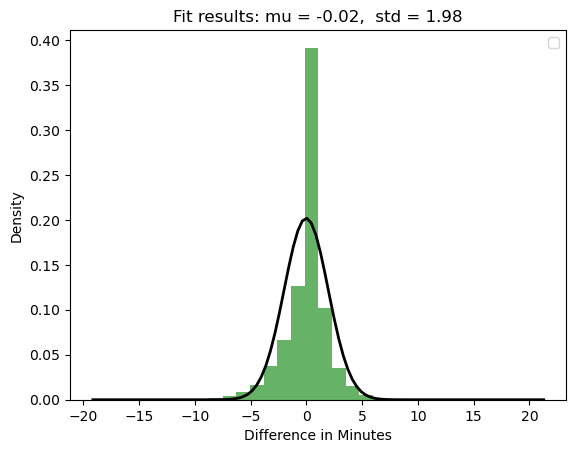

In [18]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

# Creating a DataFrame of display actual vs predicted values
results_df = pd.DataFrame({'Actual Holding Time (minutes)': y_test, 'Predicted Holding Time (minutes)': predictions,'Difference (minutes)':(predictions-y_test)})

#Resetting the index of the DataFrame 
results_df = results_df.reset_index(drop=True)

print(results_df)
#results_df.to_csv('difference bell curve')

# Calculate mean and standard deviation of the differences
mu, std = results_df['Difference (minutes)'].mean(), results_df['Difference (minutes)'].std()

# Plot histogram of the differences
plt.hist(results_df['Difference (minutes)'], bins=30, density=True, alpha=0.6, color='g')

# Add a normal distribution curve
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, std)
plt.plot(x, p, 'k', linewidth=2)
title = "Fit results: mu = %.2f,  std = %.2f" % (mu, std)
plt.title(title)

# Adding legend
plt.legend()

# Add title and labels
#plt.title("Distribution of Time Difference between Actual and Predicted in Minutes")
plt.xlabel("Difference in Minutes")
plt.ylabel("Density")

#save the plot in png
plt.savefig("Density_histogram.png")

# Show the plot
plt.show()